# Libraries

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import string
import re
import os
import nltk
from nltk.stem import WordNetLemmatizer
import contractions
import spacy
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from umap import UMAP
import plotly.express as px
import seaborn as sns

# Read Data

## Symptoms Data (Posts)

In [2]:
post_data = pd.read_csv('./data/BeyondBlue/conditions_data_post_stitched.csv', index_col=0)
print(f"Data loaded with {post_data.shape[0]} rows.")
post_data.head()

Data loaded with 17499 rows.


,Post_Title,Post_Content,Post_Author,Post_Author_Rank,Post_Date,Post_Category,Number_of_Comments,Post_URL
Post_ID,,,,,,,,
Anxi-1,I’m stuck!,I’ve never written on a forum like this before...,Guest_39557583,Community Member,20-06-2025,Anxiety,6,/t5/anxiety/i-m-stuck/td-p/611578
Anxi-2,Back injury anxiety,Hi. I'm new here. I am extremely anxious when ...,Guest42,Community Member,10-07-2025,Anxiety,0,/t5/anxiety/back-injury-anxiety/td-p/612114
Anxi-3,"Anxiety, Injustice, and Fear: Workplace Exploi...","Hi everyone,I’m going through one of the most ...",Joker_J,Community Member,09-07-2025,Anxiety,1,/t5/anxiety/anxiety-injustice-and-fear-workpla...
Anxi-4,Im lost and wasn't sure what should I do next.,I am international student to Tasmania in 2021...,tevont,Community Member,20-06-2025,Anxiety,2,/t5/anxiety/im-lost-and-wasn-t-sure-what-shoul...
Anxi-5,Just broke free from rude friend and I still f...,"Recently, I have left my old friend who would ...",waffle_puppy,Community Member,27-06-2025,Anxiety,3,/t5/anxiety/just-broke-free-from-rude-friend-a...


Get all unique Author Ranks:

In [3]:
post_data['Post_Author_Rank'].unique()

array(['Community Member', 'Blue Voices Member', 'Community Manager',
       'Champion Alumni', 'Community Champion', 'Valued Contributor',
       'Beyond Blue Staff', 'Moderator'], dtype=object)

Filter only posts from 'Community Member's

In [4]:
post_data_filtered = post_data[post_data['Post_Author_Rank'] == 'Community Member']
print(f"Filtered data contains {post_data_filtered.shape[0]} rows for 'Community Member' rank.")
post_data_filtered.head()

Filtered data contains 16627 rows for 'Community Member' rank.


,Post_Title,Post_Content,Post_Author,Post_Author_Rank,Post_Date,Post_Category,Number_of_Comments,Post_URL
Post_ID,,,,,,,,
Anxi-1,I’m stuck!,I’ve never written on a forum like this before...,Guest_39557583,Community Member,20-06-2025,Anxiety,6,/t5/anxiety/i-m-stuck/td-p/611578
Anxi-2,Back injury anxiety,Hi. I'm new here. I am extremely anxious when ...,Guest42,Community Member,10-07-2025,Anxiety,0,/t5/anxiety/back-injury-anxiety/td-p/612114
Anxi-3,"Anxiety, Injustice, and Fear: Workplace Exploi...","Hi everyone,I’m going through one of the most ...",Joker_J,Community Member,09-07-2025,Anxiety,1,/t5/anxiety/anxiety-injustice-and-fear-workpla...
Anxi-4,Im lost and wasn't sure what should I do next.,I am international student to Tasmania in 2021...,tevont,Community Member,20-06-2025,Anxiety,2,/t5/anxiety/im-lost-and-wasn-t-sure-what-shoul...
Anxi-5,Just broke free from rude friend and I still f...,"Recently, I have left my old friend who would ...",waffle_puppy,Community Member,27-06-2025,Anxiety,3,/t5/anxiety/just-broke-free-from-rude-friend-a...


Concatenate 'Post_Title' and 'Post_Content' into a new column 'Post_Title_Content' and select only 'Post_Title_Content', 'Post_Author', 'Post_Date', 'Post_Category', and 'Number_of_Comments'.

In [5]:
# Custom function to check punctuation and concatenate
def smart_concat(row):
    end_punctuations = {'!', '?'}
    if row['Post_Title'] and row['Post_Title'][-1] in end_punctuations:
        return row['Post_Title'] + ' ' + row['Post_Content']
    else:
        return row['Post_Title'].rstrip() + '. ' + row['Post_Content']

In [6]:
post_data_final = post_data_filtered.copy()
post_data_final["Post_Title_Content"] = post_data_final.apply(smart_concat, axis=1)
post_data_final = post_data_final[["Post_Title_Content", "Post_Author", "Post_Date", "Post_Category", "Number_of_Comments"]]
post_data_final.head()


,Post_Title_Content,Post_Author,Post_Date,Post_Category,Number_of_Comments
Post_ID,,,,,
Anxi-1,I’m stuck! I’ve never written on a forum like ...,Guest_39557583,20-06-2025,Anxiety,6
Anxi-2,Back injury anxiety. Hi. I'm new here. I am ex...,Guest42,10-07-2025,Anxiety,0
Anxi-3,"Anxiety, Injustice, and Fear: Workplace Exploi...",Joker_J,09-07-2025,Anxiety,1
Anxi-4,Im lost and wasn't sure what should I do next....,tevont,20-06-2025,Anxiety,2
Anxi-5,Just broke free from rude friend and I still f...,waffle_puppy,27-06-2025,Anxiety,3


Check each column data types:

In [7]:
print(post_data_final.dtypes)

Post_Title_Content    object
Post_Author           object
Post_Date             object
Post_Category         object
Number_of_Comments     int64
dtype: object


Convert each column to appropriate data types:

In [8]:
# Convert 'Post_Date' to datetime
post_data_final['Post_Date'] = pd.to_datetime(post_data_final['Post_Date'], dayfirst=True, errors='coerce')

# Convert 'Number_of_Comments' to integer
post_data_final['Number_of_Comments'] = pd.to_numeric(post_data_final['Number_of_Comments'], errors='coerce').astype('Int64')

# Ensure other columns are string/object
post_data_final['Post_Title_Content'] = post_data_final['Post_Title_Content'].astype(str)

# Convert 'Post_Author' and 'Post_Category' to categorical types
post_data_final['Post_Author'] = post_data_final['Post_Author'].astype('category')
post_data_final['Post_Category'] = post_data_final['Post_Category'].astype('category')

print(post_data_final.dtypes)

Post_Title_Content            object
Post_Author                 category
Post_Date             datetime64[ns]
Post_Category               category
Number_of_Comments             Int64
dtype: object


In [9]:
post_data_final.head()

,Post_Title_Content,Post_Author,Post_Date,Post_Category,Number_of_Comments
Post_ID,,,,,
Anxi-1,I’m stuck! I’ve never written on a forum like ...,Guest_39557583,2025-06-20,Anxiety,6
Anxi-2,Back injury anxiety. Hi. I'm new here. I am ex...,Guest42,2025-07-10,Anxiety,0
Anxi-3,"Anxiety, Injustice, and Fear: Workplace Exploi...",Joker_J,2025-07-09,Anxiety,1
Anxi-4,Im lost and wasn't sure what should I do next....,tevont,2025-06-20,Anxiety,2
Anxi-5,Just broke free from rude friend and I still f...,waffle_puppy,2025-06-27,Anxiety,3


## Mental Health Severity Data (Comments) 

In [2]:
mental_health_sev_table = pd.read_csv('./data/BeyondBlue/commented_post_authors_edited.csv')

In [3]:
mental_health_sev_table.head()

,Post_ID,Author,Author_Post,Author_Last_Comment,Beyond Blue Staff,Blue Voices Member,Champion Alumni,Community Champion,Community Member,Moderator,Valued Contributor,Days_Between
0,Anxi-6,Amenace,"Parental Anxiety. Hi Everyone, I am not quite ...",Thank you Indigo. I am seeing a counsellor ton...,0,0,0,1,0,0,0,0
1,Anxi-12,Whatsinaname,"Horrible week. Hi everyone, I am having a horr...",Since my last post I ended up quitting my job....,0,2,28,3,8,0,1,1765
2,Anxi-13,Sammy,New relationship anxiety. Dear adjust need a c...,Such a good idea this too shallpass thanks for...,0,0,0,0,2,0,0,161
3,Anxi-17,Olive83,Easy strategies for quick response. Recently m...,You are not wrong Caught between! And I did ex...,0,0,0,1,4,0,1,8
4,Anxi-28,jordan,"Vomiting, GAD, herd. Hello everyone, I have ha...",I am replying after a year. Thank you for your...,0,0,0,0,1,1,0,359


# Exploratory Data Analysis

## Symptoms Data (Posts)

### Number of Unique Authors

In [10]:
unique_authors = post_data_final['Post_Author'].nunique()
print(f"Number of unique authors: {unique_authors}")

Number of unique authors: 12401


### Top 10 Authors by Number of Posts

In [11]:
top_10_authors = post_data_final['Post_Author'].value_counts().head(10)
print("Top 10 authors by number of posts:")
print(top_10_authors)

Top 10 authors by number of posts:
Post_Author
PsychedelicFur    31
44Max44           25
Elephant86        25
Bluey_moon        24
Chicken_Wings     22
HelenM            22
Chloekat84        20
gloria10          20
Living57          19
Alel              19
Name: count, dtype: int64


### Distribution of Post_Title_Content Lengths

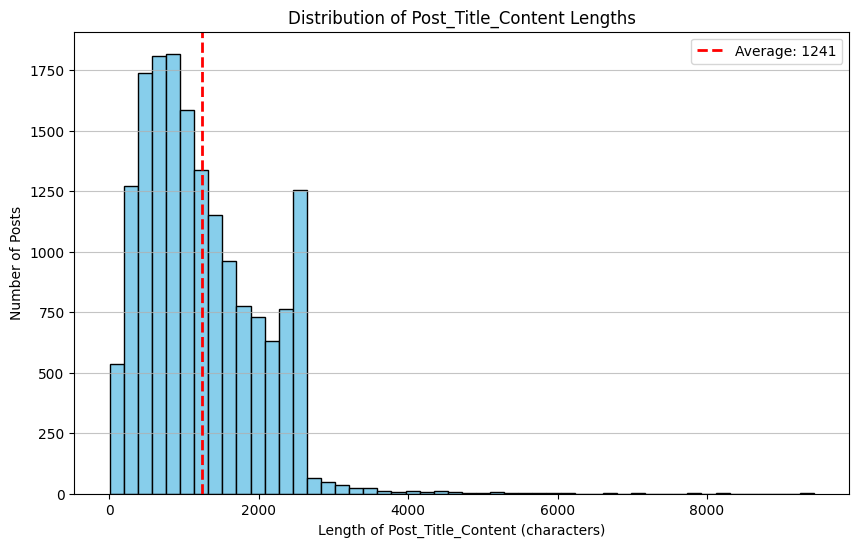

In [12]:
# Calculate lengths of Post_Title_Content
content_lengths = post_data_final['Post_Title_Content'].str.len()

plt.figure(figsize=(10, 6))
plt.hist(content_lengths, bins=50, color='skyblue', edgecolor='black')
plt.title('Distribution of Post_Title_Content Lengths')
plt.xlabel('Length of Post_Title_Content (characters)')
plt.ylabel('Number of Posts')
plt.grid(axis='y', alpha=0.75)
avg_length = content_lengths.mean()
plt.axvline(avg_length, color='red', linestyle='dashed', linewidth=2, label=f'Average: {avg_length:.0f}')
plt.legend()
plt.show()

### Number of Posts by Year

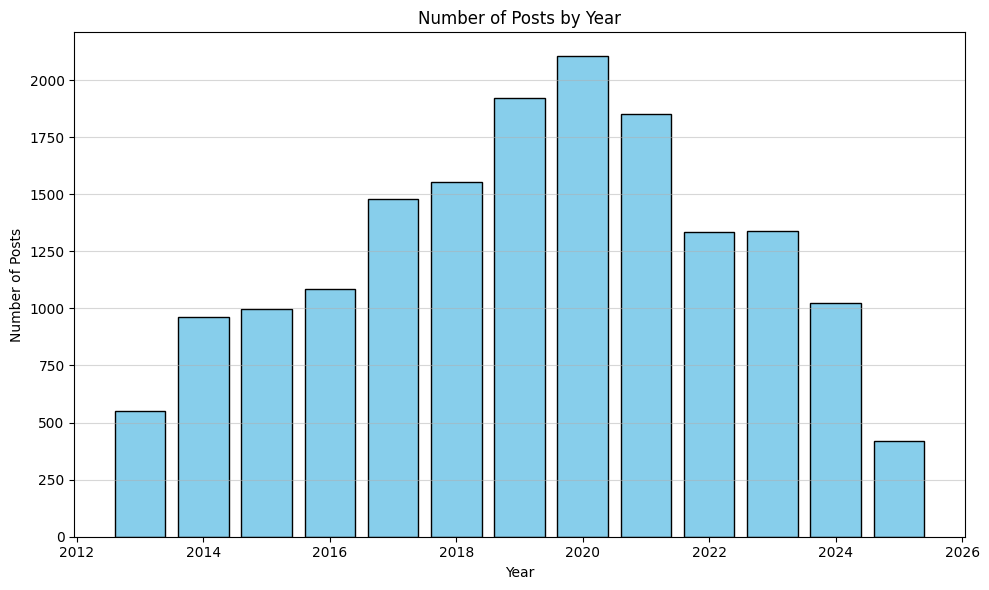

In [13]:
# Extract year from 'Post_Date'
post_data_final['Year'] = post_data_final['Post_Date'].dt.year

# Count number of posts per year
posts_by_year = post_data_final['Year'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
plt.bar(posts_by_year.index, posts_by_year.values, color='skyblue', edgecolor='black')
plt.title('Number of Posts by Year')
plt.xlabel('Year')
plt.ylabel('Number of Posts')
plt.grid(axis='y', alpha=0.5)
plt.tight_layout()
plt.show()

### Number of Posts by Year and Category

<Figure size 1200x700 with 0 Axes>

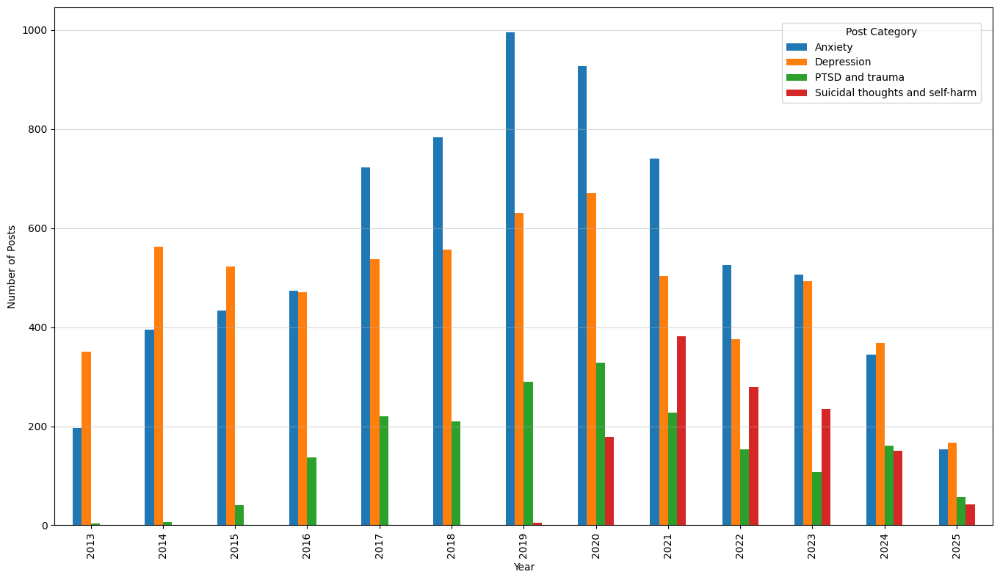

In [14]:
# Group by 'Year' and 'Post_Category', then count number of posts
posts_by_year_category = post_data_final.groupby(['Year', 'Post_Category'], observed=False).size().unstack(fill_value=0)

# Plot
plt.figure(figsize=(12, 7))
posts_by_year_category.plot(kind='bar', stacked=False, figsize=(14, 8))
# plt.title('Number of Posts by Year for Each Category')
plt.xlabel('Year')
plt.ylabel('Number of Posts')
plt.legend(title='Post Category', bbox_to_anchor=(0.77, 0.98), loc='upper left')
plt.tight_layout()
plt.grid(axis='y', alpha=0.5)
plt.show()

### Pie Chart of Categories

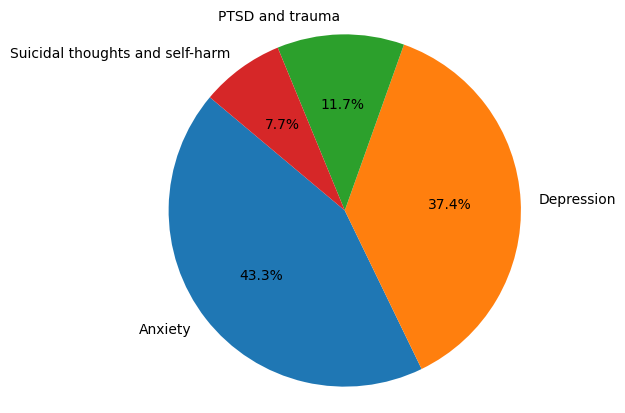

In [15]:
# Pie chart of post categories
category_counts = post_data_final['Post_Category'].value_counts()

plt.figure(figsize=(5, 5))
plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', startangle=140)
# plt.title('Distribution of Post Categories')
plt.axis('equal')
plt.show()

### Distribution of Number of Comments

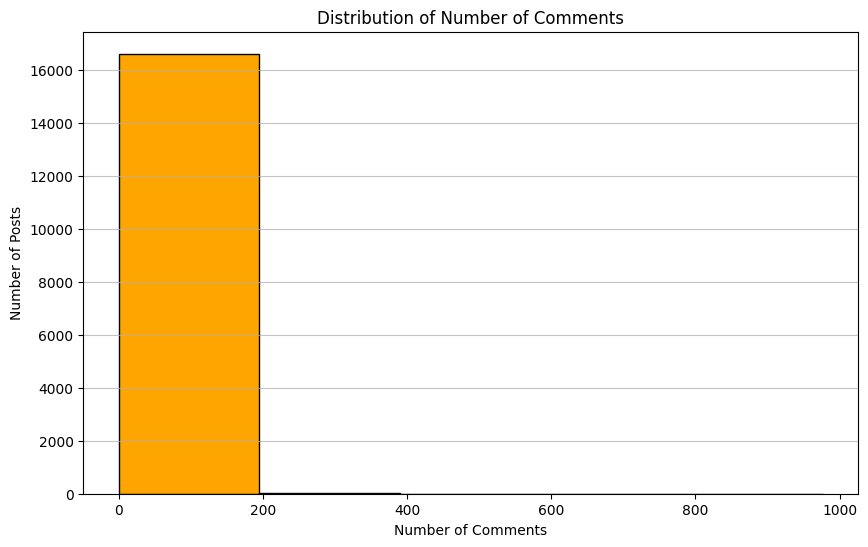

In [16]:
plt.figure(figsize=(10, 6))
plt.hist(post_data_final['Number_of_Comments'].dropna(), bins=5, color='orange', edgecolor='black')
plt.title('Distribution of Number of Comments')
plt.xlabel('Number of Comments')
plt.ylabel('Number of Posts')
plt.grid(axis='y', alpha=0.75)
plt.show()

### Word Cloud

In [17]:
# !python -m spacy download en_core_web_sm

In [17]:
nlp = spacy.load("en_core_web_sm")
nltk.download('stopwords', quiet=True)

stop_words = set(STOPWORDS).union(set(nltk.corpus.stopwords.words('english')))

def preprocess_text(text):
    # Expand contractions
    text = contractions.fix(text)
    # Lowercase
    text = text.lower()
    # Remove punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))
    # Remove digits not contained within a word (standalone digits)
    text = re.sub(r'\b\d+\b', '', text)
    # Tokenize and remove stopwords
    nlp_text = nlp(text)
    words = ' '.join([token.lemma_ for token in nlp_text if not token.is_stop and not token.is_punct])
    return words # ' '.join(words)


#### Anxiety

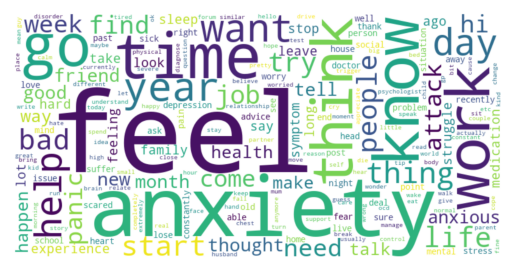

In [19]:
# Generate word cloud if rerun is True or the file does not exist
rerun = False  # Set this to True if you want to regenerate the word cloud
if not os.path.exists("./graphs/word_cloud_anxiety.png") or rerun:
    # Combine all text and preprocess
    post_data_final_anxiety = post_data_final[post_data_final['Post_Category'] == 'Anxiety']
    all_text_anxiety = post_data_final_anxiety['Post_Title_Content'].astype(str).apply(preprocess_text).str.cat(sep=' ')

    # Generate word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white', stopwords=stop_words, collocations=False).generate(all_text_anxiety)
    
    plt.figure(figsize=(15, 7))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.savefig("./graphs/word_cloud_anxiety.png")
    plt.show()
else:
    # If the file already exists, just display it
    image = plt.imread("./graphs/word_cloud_anxiety.png")
    plt.imshow(image)
    plt.axis("off")  # Optional: hides axis ticks
    plt.show()


#### Depression

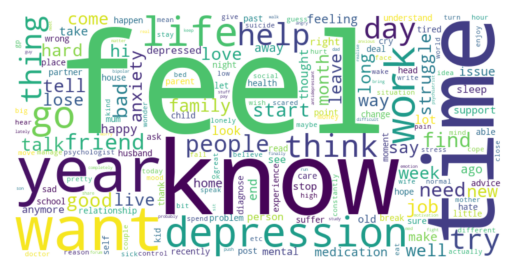

In [20]:
# Generate word cloud if rerun is True or the file does not exist
rerun = False  # Set this to True if you want to regenerate the word cloud
if not os.path.exists("./graphs/word_cloud_depression.png") or rerun:
    # Combine all text and preprocess
    post_data_final_depression = post_data_final[post_data_final['Post_Category'] == 'Depression']
    all_text_depression = post_data_final_depression['Post_Title_Content'].astype(str).apply(preprocess_text).str.cat(sep=' ')

    # Generate word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white', stopwords=stop_words, collocations=False).generate(all_text_depression)
    
    plt.figure(figsize=(15, 7))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.savefig("./graphs/word_cloud_depression.png")
    plt.show()
else:
    # If the file already exists, just display it
    image = plt.imread("./graphs/word_cloud_depression.png")
    plt.imshow(image)
    plt.axis("off")  # Optional: hides axis ticks
    plt.show()

#### PTSD and Trauma

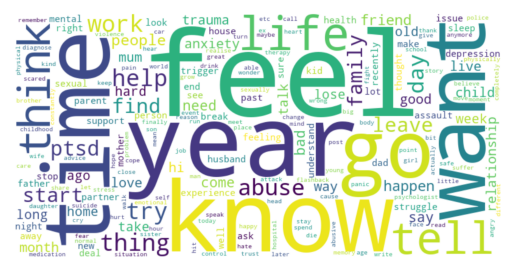

In [21]:
# Generate word cloud if rerun is True or the file does not exist
rerun = False  # Set this to True if you want to regenerate the word cloud
if not os.path.exists("./graphs/word_cloud_ptsd.png") or rerun:
    # Combine all text and preprocess
    post_data_final_ptsd = post_data_final[post_data_final['Post_Category'] == 'PTSD and trauma']
    all_text_ptsd = post_data_final_ptsd['Post_Title_Content'].astype(str).apply(preprocess_text).str.cat(sep=' ')

    # Generate word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white', stopwords=stop_words, collocations=False).generate(all_text_ptsd)
    
    plt.figure(figsize=(15, 7))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.savefig("./graphs/word_cloud_ptsd.png")
    plt.show()
else:
    # If the file already exists, just display it
    image = plt.imread("./graphs/word_cloud_ptsd.png")
    plt.imshow(image)
    plt.axis("off")  # Optional: hides axis ticks
    plt.show()


#### Suicidal thoughts and self-harm

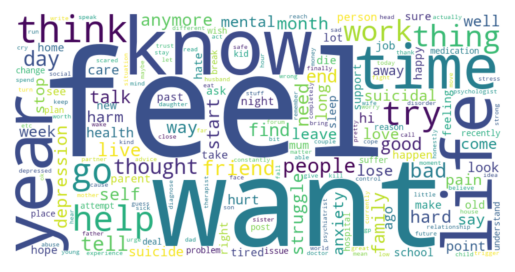

In [22]:
# Generate word cloud if rerun is True or the file does not exist
rerun = False  # Set this to True if you want to regenerate the word cloud
if not os.path.exists("./graphs/word_cloud_suicidal.png") or rerun:
    # Combine all text and preprocess
    post_data_final_suicidal = post_data_final[post_data_final['Post_Category'] == 'Suicidal thoughts and self-harm']
    all_text_suicidal = post_data_final_suicidal['Post_Title_Content'].astype(str).apply(preprocess_text).str.cat(sep=' ')

    # Generate word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white', stopwords=stop_words, collocations=False).generate(all_text_suicidal)

    plt.figure(figsize=(15, 7))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.savefig("./graphs/word_cloud_suicidal.png")
    plt.show()
else:
    # If the file already exists, just display it
    image = plt.imread("./graphs/word_cloud_suicidal.png")
    plt.imshow(image)
    plt.axis("off")  # Optional: hides axis ticks
    plt.show()


### Embedding Visualization

#### Embedding

In [18]:
# Load the fast 'all-MiniLM-L6-v2' transformer model
embedding_model = SentenceTransformer('all-MiniLM-L6-v2')

In [19]:
rerun = False # Set this to True if you want to regenerate embeddings
# Check if embeddings file exists or if rerun is True
if not os.path.exists("./data/BeyondBlue/embeddings.csv") or rerun:
    # generate embeddings
    embeddings = embedding_model.encode(post_data_final["Post_Title_Content"], show_progress_bar=True)
    # Convert to DataFrame
    embeddings = pd.DataFrame(embeddings)
    # Save
    embeddings.to_csv("./data/BeyondBlue/embeddings.csv", index=False)
else:
    # Load existing embeddings
    embeddings = pd.read_csv("./data/BeyondBlue/embeddings.csv").values

#### Docs

In [20]:
rerun = False # Set this to True if you want to regenerate preprocessed text
if not os.path.exists("./data/BeyondBlue/preprocessed_title_content.csv") or rerun:
    # new empty DataFrame to store preprocessed text
    preprocessed_text_df = pd.DataFrame(columns=['Post_Title_Content'])
    # Preprocess text
    preprocessed_text_df['Post_Title_Content'] = post_data_final['Post_Title_Content'].astype(str).apply(preprocess_text)
    # Save preprocessed text
    preprocessed_text_df.to_csv("./data/BeyondBlue/preprocessed_title_content.csv", index=False)
else:
    # Load existing preprocessed text
    preprocessed_text_df = pd.read_csv("./data/BeyondBlue/preprocessed_title_content.csv")
    preprocessed_text_df['Post_Title_Content'] = preprocessed_text_df['Post_Title_Content'].astype(str) # Ensure the column is of type string

docs = preprocessed_text_df['Post_Title_Content']
docs.head()


0    stuck write forum like struggle talk go insecu...
1    injury anxiety hi new extremely anxious need l...
2    anxiety injustice fear workplace exploitation ...
3    lose sure international student tasmania   wor...
4    break free rude friend feel bad recently leave...
Name: Post_Title_Content, dtype: object

#### Fit Model

In [21]:
# create the model
topic_model = BERTopic(embedding_model=embedding_model)
# Fit the model to the question titles and bodies
topics, probs = topic_model.fit_transform(docs, embeddings=embeddings)

#### Visualizations

##### Visualize Documents by Class

In [32]:
umap_model_2 = UMAP(
    n_neighbors=10,
    n_components=2,
    min_dist=0.0,
    metric="cosine",
    random_state=10
)
reduced = umap_model_2.fit_transform(embeddings)
reduced_df = pd.DataFrame(reduced, columns=['x', 'y'])
reduced_df['text'] = docs
reduced_df['class'] = post_data_final['Post_Category'].to_list()
reduced_df.head()

,x,y,text,class
0,-1.203218,8.374950,stuck write forum like struggle talk go insecu...,Anxiety
1,-0.292459,4.743594,injury anxiety hi new extremely anxious need l...,Anxiety
2,-1.494520,5.457524,anxiety injustice fear workplace exploitation ...,Anxiety
3,-1.926930,6.439652,lose sure international student tasmania wor...,Anxiety
4,0.100858,10.169621,break free rude friend feel bad recently leave...,Anxiety


In [33]:
fig = px.scatter(
    reduced_df, x="x", y="y",
    color="class",
    hover_name="text",
    opacity=0.7,
    width=1200,
    height=800,
    color_discrete_map={       # map each class to a colour
        "Anxiety": "#1F77B4",
        "Depression": "#FF7F0E",
        "PTSD and trauma": "#2CA02C",
        "Suicidal thoughts and self-harm": "#D62728"
    }

)
fig.update_traces(marker=dict(size=4))
fig.update_layout(
    plot_bgcolor="white", 
    paper_bgcolor="white",
    legend=dict(
        x=0.90,           # relative position from left
        y=0.98,           # relative position from bottom
        xanchor="right",   # pin the legend's left edge to x
        yanchor="top",    # pin the legend's top edge to y
        bgcolor="rgba(255,255,255,0.6)",
        bordercolor="black",
        borderwidth=1
    )

)
fig.show()


## Mental Health Severity Data (Comments)

### Distribution of Comments by Author_Rank

In [11]:
mental_health_sev_table.head()

,Post_ID,Author,Author_Post,Author_Last_Comment,Beyond Blue Staff,Blue Voices Member,Champion Alumni,Community Champion,Community Member,Moderator,Valued Contributor,Days_Between
0,Anxi-6,Amenace,"Parental Anxiety. Hi Everyone, I am not quite ...",Thank you Indigo. I am seeing a counsellor ton...,0,0,0,1,0,0,0,0
1,Anxi-12,Whatsinaname,"Horrible week. Hi everyone, I am having a horr...",Since my last post I ended up quitting my job....,0,2,28,3,8,0,1,1765
2,Anxi-13,Sammy,New relationship anxiety. Dear adjust need a c...,Such a good idea this too shallpass thanks for...,0,0,0,0,2,0,0,161
3,Anxi-17,Olive83,Easy strategies for quick response. Recently m...,You are not wrong Caught between! And I did ex...,0,0,0,1,4,0,1,8
4,Anxi-28,jordan,"Vomiting, GAD, herd. Hello everyone, I have ha...",I am replying after a year. Thank you for your...,0,0,0,0,1,1,0,359


Beyond Blue Staff        29
Blue Voices Member     7156
Champion Alumni        8371
Community Champion     6410
Community Member      16888
Moderator              2129
Valued Contributor     5521
dtype: int64


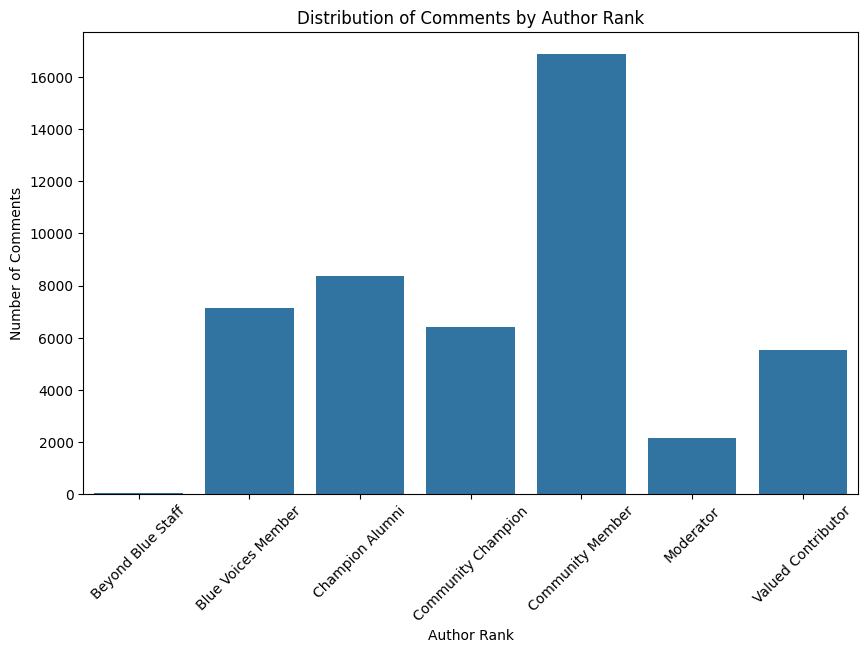

In [17]:
# sum the columns 'Beyond Blue Staff', 'Blue Voices Member', 'Champion Alumni', 'Community Champion', 'Community Member', 'Moderator', and 'Valued Contributor'
total_by_rank = mental_health_sev_table[['Beyond Blue Staff', 'Blue Voices Member', 'Champion Alumni', 'Community Champion', 'Community Member', 'Moderator', 'Valued Contributor']].sum(axis=0)
print(total_by_rank)

# visualise the distribution of total_by_rank
plt.figure(figsize=(10, 6))
sns.barplot(x=total_by_rank.index, y=total_by_rank.values)
plt.title('Distribution of Comments by Author Rank')
plt.xlabel('Author Rank')
plt.ylabel('Number of Comments')
plt.xticks(rotation=45)
plt.show()


### Distribution of days_between

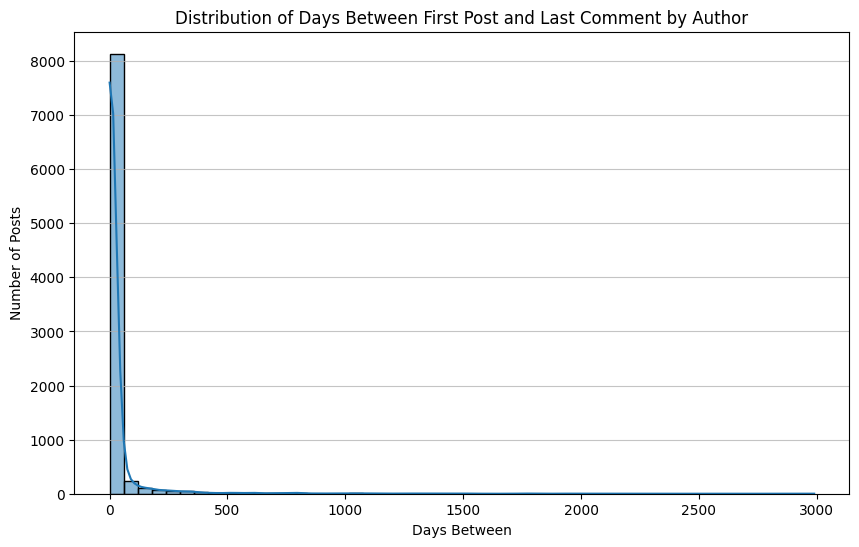

In [31]:
# visualise the distribution of Days_Between
plt.figure(figsize=(10, 6))
sns.histplot(data=mental_health_sev_table, x='Days_Between', bins=50, kde=True)
plt.title('Distribution of Days Between First Post and Last Comment by Author')
plt.xlabel('Days Between')
plt.ylabel('Number of Posts')
plt.grid(axis='y', alpha=0.75)
plt.show()

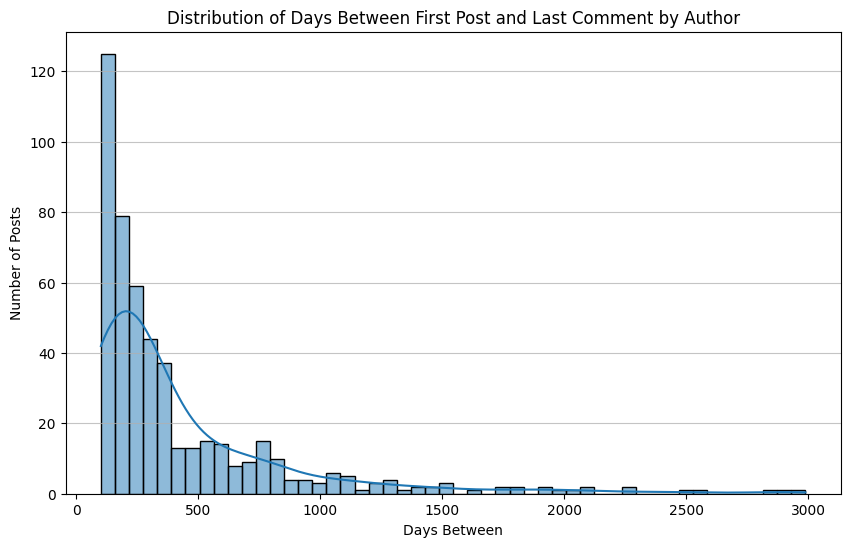

In [30]:
# visualise the distribution of Days_Between but only for values more than or equal to 100
plt.figure(figsize=(10, 6))
sns.histplot(data=mental_health_sev_table[mental_health_sev_table['Days_Between'] >= 100], x='Days_Between', bins=50, kde=True)
plt.title('Distribution of Days Between First Post and Last Comment by Author')
plt.xlabel('Days Between')
plt.ylabel('Number of Posts')
plt.grid(axis='y', alpha=0.75)
plt.show()

In [27]:
mental_health_sev_table[mental_health_sev_table['Days_Between'] > 500]

,Post_ID,Author,Author_Post,Author_Last_Comment,Beyond Blue Staff,Blue Voices Member,Champion Alumni,Community Champion,Community Member,Moderator,Valued Contributor,Days_Between
1,Anxi-12,Whatsinaname,"Horrible week. Hi everyone, I am having a horr...",Since my last post I ended up quitting my job....,0,2,28,3,8,0,1,1765
62,Anxi-174,bigaloo,"Anxiety+Comparing oneself. Hi all, I just want...","Hey Tranczcrybe, It is being a while since I p...",0,0,0,0,1,0,1,517
75,Anxi-207,Beaser,Feeling Scared Again. Hi and best wishes to ev...,Hi to everyone. Sometimes life just seems abou...,0,0,0,0,25,0,5,801
104,Anxi-266,CMF,"Dear Anxiety. At times, I tell my anxiety to s...",Thank you Annas1 I had a day out shopping with...,0,0,1,0,19,0,0,545
149,Anxi-367,Ail_,Peripheral Neuropathy. I have had numerous sle...,"Thankyou for replying, and it is comforting to...",0,0,0,0,1,0,2,646
...,...,...,...,...,...,...,...,...,...,...,...,...
8576,Suic-792,Catie 08,Scrambled. Hi. I am a survivor of childhood se...,I am feeling a bit worried about going to ther...,0,8,3,1,360,4,7,560
8606,Suic-861,Waxer,"Help. Hi, I have been married for 36 years, I ...","Hi all, Just thought I would give you an updat...",0,0,0,64,3,20,0,603
8632,Suic-930,Ausdog,Been on here before... guess it's a merry-go-r...,"My girlfriend left, I find out she was seeing ...",0,0,1,1,0,0,0,1212
8724,Suic-1145,DeltaJ,"My dealings with the health system, is it tail...",Thank you to both of you for your kind words. ...,0,2,1,4,0,1,0,599
